# Visualización Algoritmo de Grover
> Marcos Escudero Matanza

## Interpretación de la Esfera de Bloch

### Posiciones fundamentales

- **Polo norte (+Z)**  
  $$
  |0\rangle
  $$

- **Polo sur (-Z)**  
  $$
  |1\rangle
  $$

- **Eje +X**  
  $$
  \frac{|0\rangle + |1\rangle}{\sqrt{2}}
  $$

- **Eje -X**  
  $$
  \frac{|0\rangle - |1\rangle}{\sqrt{2}}
  $$

- **Eje +Y**  
  $$
  \frac{|0\rangle + i|1\rangle}{\sqrt{2}}
  $$

- **Eje -Y**  
  $$
  \frac{|0\rangle - i|1\rangle}{\sqrt{2}}
  $$



# Algoritmo de Grover

El algoritmo de Grover es un algoritmo cuántico que permite buscar un elemento marcado dentro de un espacio no estructurado de tamaño $ N = 2^n $ en un número de pasos proporcional a  $ \mathcal{O}(\sqrt{N}), $
lo que supone una aceleración cuadrática respecto a los algoritmos clásicos.

---

## Fases del Algoritmo de Grover

El algoritmo consta de tres fases principales: **preparación**, **oráculo** y **difusión**.

---

## 1 Superposición Inicial

Se parte del estado base:
$$
|0\rangle^{\otimes n}
$$

Aplicando una puerta de Hadamard a cada qubit:
$$
H^{\otimes n} |0\rangle^{\otimes n}
$$

se obtiene el estado de superposición uniforme:
$$
|\psi_0\rangle = \frac{1}{\sqrt{N}} \sum_{x=0}^{N-1} |x\rangle
$$

### Interpretación en la esfera de Bloch
- Cada qubit pasa del **polo norte** \(+Z\) al **eje +X**
- Esto corresponde al estado:
$$
|+\rangle = \frac{|0\rangle + |1\rangle}{\sqrt{2}}
$$
- Todos los estados computacionales tienen la misma amplitud y fase

---

## 2 Oráculo (por iteración)

El **oráculo** marca el estado objetivo $ |x_0\rangle $ invirtiendo su fase:

$$
O |x\rangle =
\begin{cases}
-|x\rangle & \text{si } x = x_0 \\
\ \ |x\rangle & \text{si } x \neq x_0
\end{cases}
$$

Formalmente:
$$
O = I - 2 |x_0\rangle \langle x_0|
$$

### Implementación típica
- Puertas **X** para transformar el estado objetivo en $ |11\ldots1\rangle $
- Una puerta controlada (**CZ** o **MCX**) para invertir la fase
- Puertas **X** para deshacer la preparación

### Interpretación en la esfera de Bloch
- No cambia las probabilidades
- Introduce una **fase relativa de $ \pi $** en el estado objetivo
- Esta fase es invisible en una medición directa, pero esencial para la interferencia posterior

---

## 3 Difusión (Inversión respecto a la media)

El **difusor de Grover** amplifica la amplitud del estado marcado reflejando el estado cuántico respecto a la media:

$$
D = 2 |\psi_0\rangle \langle \psi_0| - I
$$

### Secuencia de puertas
$$
H^{\otimes n} \rightarrow X^{\otimes n} \rightarrow CZ \rightarrow X^{\otimes n} \rightarrow H^{\otimes n}
$$

### Interpretación geométrica
- El oráculo y el difusor combinados producen una **rotación** en un subespacio bidimensional
- Este subespacio está generado por:
  - $ |x_0\rangle $ (estado solución)
  - $ |\psi_\perp\rangle $ (superposición de los no-solución)

Cada iteración rota el estado un ángulo:
$$
\theta = 2 \arcsin\left(\frac{1}{\sqrt{N}}\right)
$$

---

## Iteraciones de Grover

El operador de Grover es:
$$
G = D \cdot O
$$

Tras \(k\) iteraciones:
$$
|\psi_k\rangle = G^k |\psi_0\rangle
$$

---

## Número Óptimo de Iteraciones

El número óptimo de iteraciones para una única solución es:

$$
k \approx \left\lfloor \frac{\pi}{4} \sqrt{N} \right\rfloor
$$

donde:
$$
N = 2^n
$$

- Pocas iteraciones → amplificación insuficiente
- Demasiadas iteraciones → sobre-rotación y pérdida de probabilidad

---

## Intuición Final

- El algoritmo de Grover **no prueba estados uno a uno**
- Utiliza **interferencia cuántica** para amplificar la solución
- El oráculo introduce una fase
- El difusor convierte esa fase en **probabilidad observable**
- Geométricamente, Grover es una **rotación controlada hacia el estado solución**

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from qiskit import QuantumCircuit
from qiskit.quantum_info import Statevector, partial_trace
from qiskit.visualization import (
    plot_histogram,
    circuit_drawer,
)
from qiskit.visualization.bloch import Bloch



In [2]:
def bloch_vector_from_state(statevector, qubit):
    rho = statevector.to_operator().data
    rho_red = partial_trace(
        rho,
        [i for i in range(statevector.num_qubits) if i != qubit]
    ).data

    x = 2 * np.real(rho_red[0, 1])
    y = 2 * np.imag(rho_red[1, 0])
    z = np.real(rho_red[0, 0] - rho_red[1, 1])
    return [x, y, z]


def bloch_vectors_all_qubits(statevector):
    return [
        bloch_vector_from_state(statevector, q)
        for q in range(statevector.num_qubits)
    ]


def plot_bloch_qiskit(vec, ax):
    b = Bloch(axes=ax)
    b.add_vectors(vec)
    b.render()


In [3]:
import numpy as np
from qiskit import QuantumCircuit
from qiskit.quantum_info import Statevector
import matplotlib.pyplot as plt

def run_grover_parallel_steps(n, target):
    target = target[::-1]
    qc = QuantumCircuit(n)
    sv = Statevector.from_label("0" * n)
    steps = []

    def apply_step(title, qc_step):
        nonlocal qc, sv, steps
        sv = sv.evolve(qc_step)
        qc.compose(qc_step, inplace=True)
        steps.append((title, qc.copy(), sv))

    # ─── Número óptimo de iteraciones ─────────────────────────────────────────
    N = 2 ** n
    num_iterations = int(np.floor(np.pi / 4 * np.sqrt(N)))

    # ─── Paso 0: estado inicial ───────────────────────────────────────────────
    steps.append(("Estado inicial", qc.copy(), sv))

    # ─── Paso 1: Hadamards iniciales (paralelo) ───────────────────────────────
    qc_step = QuantumCircuit(n)
    for q in range(n):
        qc_step.h(q)
    apply_step("Hadamards iniciales", qc_step)

    # ─── ITERACIONES DE GROVER ────────────────────────────────────────────────
    for it in range(num_iterations):

        # ─── ORÁCULO ─────────────────────────────────────────────────────────

        qc_step = QuantumCircuit(n)
        for t, bit in enumerate(target):
            if bit == "0":
                qc_step.x(t)
        apply_step(f"[Iter {it}] X previas al oráculo", qc_step)

        qc_step = QuantumCircuit(n)
        qc_step.h(n - 1)
        apply_step(f"[Iter {it}] H qubit objetivo (oráculo)", qc_step)

        qc_step = QuantumCircuit(n)
        qc_step.mcx(list(range(n - 1)), n - 1)
        apply_step(f"[Iter {it}] MCX del oráculo", qc_step)

        qc_step = QuantumCircuit(n)
        qc_step.h(n - 1)
        apply_step(f"[Iter {it}] H final del oráculo", qc_step)

        qc_step = QuantumCircuit(n)
        for t, bit in enumerate(target):
            if bit == "0":
                qc_step.x(t)
        apply_step(f"[Iter {it}] X invertidas (oráculo)", qc_step)

        # ─── DIFUSOR ─────────────────────────────────────────────────────────

        qc_step = QuantumCircuit(n)
        for q in range(n):
            qc_step.h(q)
        apply_step(f"[Iter {it}] Difusor: H", qc_step)

        qc_step = QuantumCircuit(n)
        for q in range(n):
            qc_step.x(q)
        apply_step(f"[Iter {it}] Difusor: X", qc_step)

        qc_step = QuantumCircuit(n)
        qc_step.h(n - 1)
        apply_step(f"[Iter {it}] Difusor: H qubit objetivo", qc_step)

        qc_step = QuantumCircuit(n)
        qc_step.mcx(list(range(n - 1)), n - 1)
        apply_step(f"[Iter {it}] Difusor: MCX", qc_step)

        qc_step = QuantumCircuit(n)
        qc_step.h(n - 1)
        apply_step(f"[Iter {it}] Difusor: H qubit objetivo (final)", qc_step)

        qc_step = QuantumCircuit(n)
        for q in range(n):
            qc_step.x(q)
        apply_step(f"[Iter {it}] Difusor: X finales", qc_step)

        qc_step = QuantumCircuit(n)
        for q in range(n):
            qc_step.h(q)
        apply_step(f"[Iter {it}] Difusor: H finales", qc_step)

    # ─── Visualización ───────────────────────────────────────────────────────
    for idx, (title, circuit, state) in enumerate(steps):

        # ─────────────────────────────────────────
        # FIGURA 1: Probabilidades + Circuito
        # ─────────────────────────────────────────
        fig1 = plt.figure(figsize=(4 * n, 4))
        gs1 = fig1.add_gridspec(1, 2, width_ratios=[1, 1])

        # Histograma
        ax_prob = fig1.add_subplot(gs1[0, 0])
        plot_histogram(state.probabilities_dict(), ax=ax_prob)
        ax_prob.set_title("Probabilidades")

        # Circuito acumulado
        ax_circ = fig1.add_subplot(gs1[0, 1])
        # Calcular escala: circuitos pequeños más grandes, circuitos grandes más pequeños
        depth = max(circuit.depth(), 1)
        if depth <= 2:
            scale = 1.2  # Circuitos muy simples: escala grande
        elif depth <= 5:
            scale = 0.4  # Circuitos pequeños: escala media
        else:
            scale = min(0.7, 3.0 / max(circuit.num_qubits, depth * 0.3))
        
        circuit_drawer(circuit, output="mpl", ax=ax_circ, fold=-1, scale=scale)
        ax_circ.set_title("Circuito acumulado")
        ax_circ.margins(x=0.15)

        fig1.suptitle(f"Paso {idx}: {title}", fontsize=14)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()


        # ─────────────────────────────────────────
        # FIGURA 2: Esferas de Bloch
        # ─────────────────────────────────────────
        fig2 = plt.figure(figsize=(4 * n, 4))
        gs2 = fig2.add_gridspec(1, n)

        bloch_vecs = bloch_vectors_all_qubits(state)
        for q in range(n):
            ax = fig2.add_subplot(gs2[0, q], projection="3d")
            plot_bloch_qiskit(bloch_vecs[q], ax)
            ax.set_title(f"Qubit {q}", loc="left")

        fig2.suptitle(f"Paso {idx}: {title} — Esferas de Bloch", fontsize=14)
        plt.tight_layout()
        plt.show()
        plt.show()



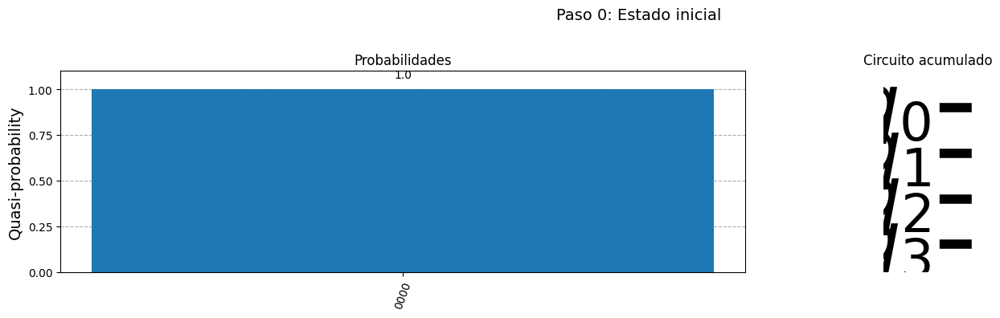

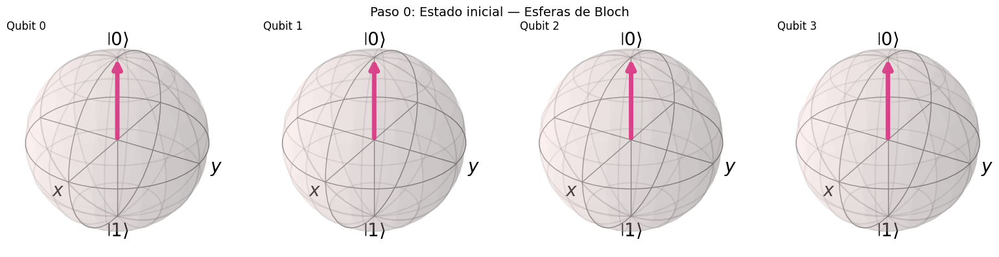

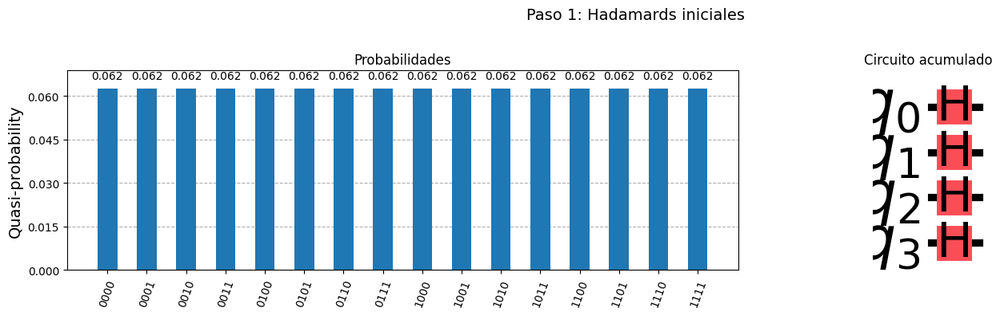

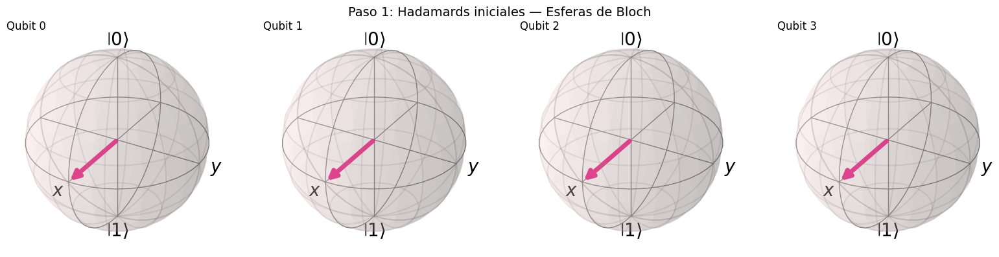

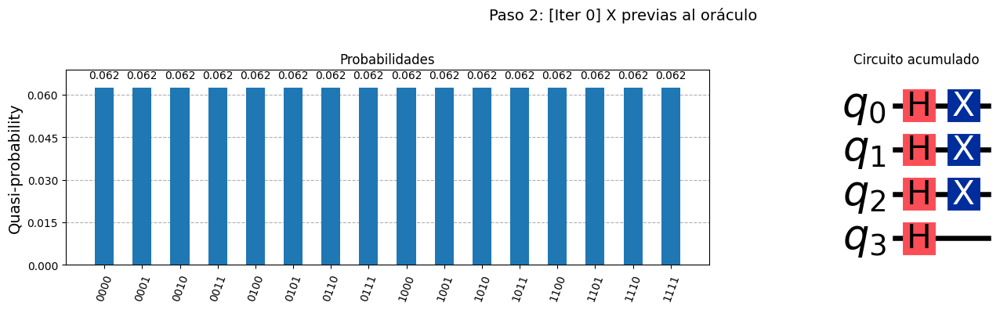

...

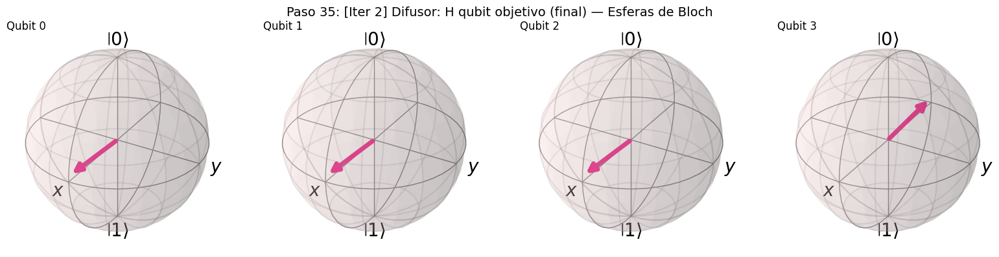

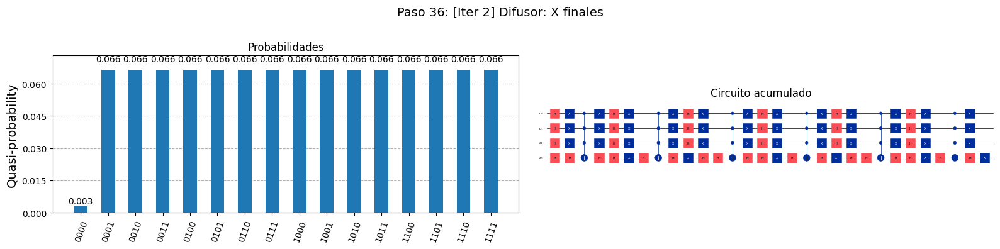

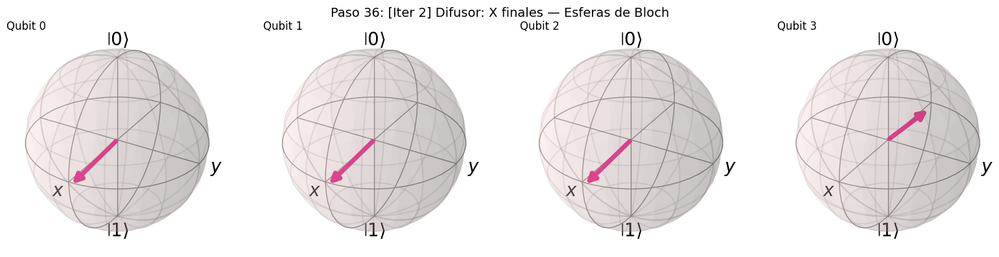

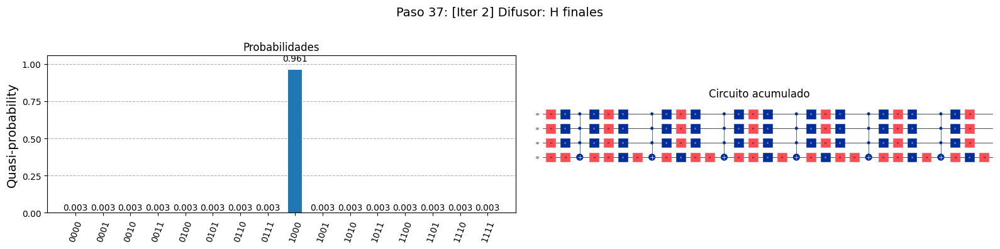

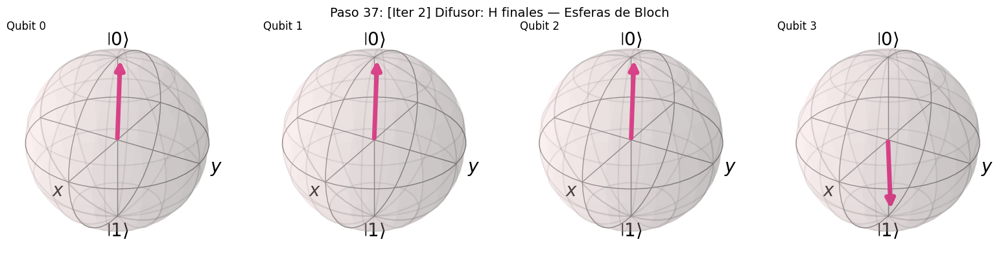

In [4]:
run_grover_parallel_steps(n=4, target="1000")